In [1]:
import numpy as np
import pandas as pd
import pickle
import os
import pdb

import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

np.random.seed(97)

In [2]:
m = ["A", "C", "G", "T"]
def id2seq(ids):
    return "".join([m[i] for i in ids])

In [3]:
final_design_seqs_dir = "/global/scratch/users/aniketh/promoter_modelling/jax_data/final_design/writeup"
ensemble_predictions_dir = "/global/scratch/users/aniketh/promoter_modelling/jax_data/ensemble_predictions/"

In [4]:
# NOTE: ensemble 0 is the original ensemble 3 and ensemble 1 is the original ensemble 4
ensemble_0_filtered_sequences = pd.read_parquet(os.path.join(ensemble_predictions_dir, 
                                                             "filtered_ensemble_3_predictions.parquet"))
ensemble_1_filtered_sequences = pd.read_parquet(os.path.join(ensemble_predictions_dir, 
                                                             "filtered_ensemble_4_predictions.parquet"))

In [5]:
def get_diff_exp(data, target):
    total = 0
    for t in ["jurkat", "k562", "thp1"]:
        if t == target:
            total += data[f'ensemble_sequences_{t}_pred']
        else:
            total -= 0.5 * data[f'ensemble_sequences_{t}_pred']
    return total

def get_data_diff_exp(data, target):
    total = 0
    for t in ["jurkat", "k562", "thp1"]:
        if t == target:
            total += data[f'{t}_output']
        else:
            total -= 0.5 * data[f'{t}_output']
    return total

best_in_dataset
5000
5000
5000
jurkat
k562
thp1


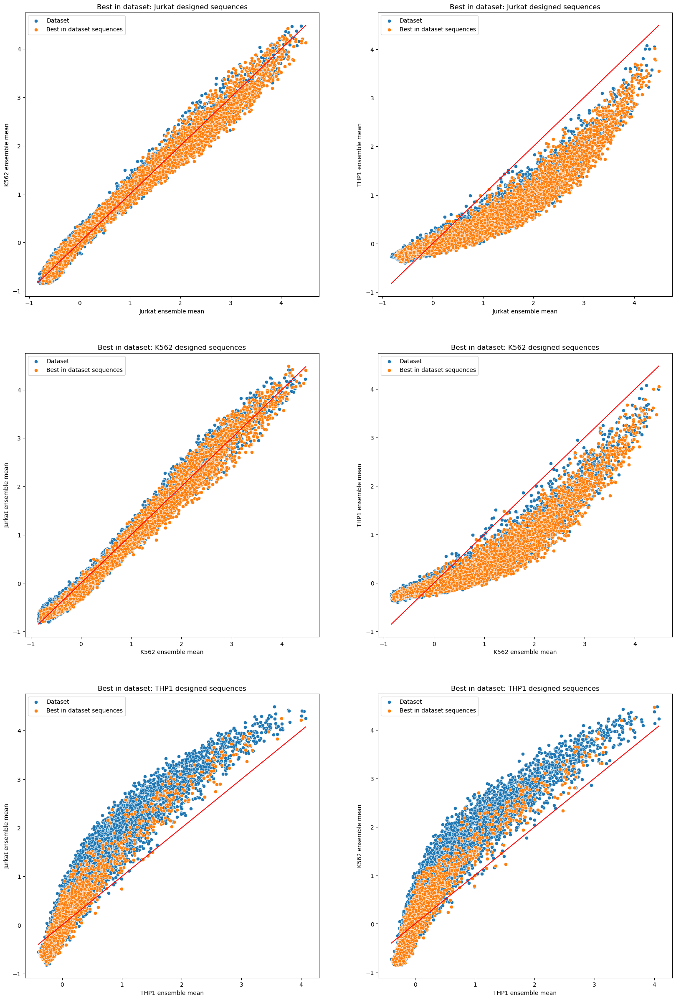

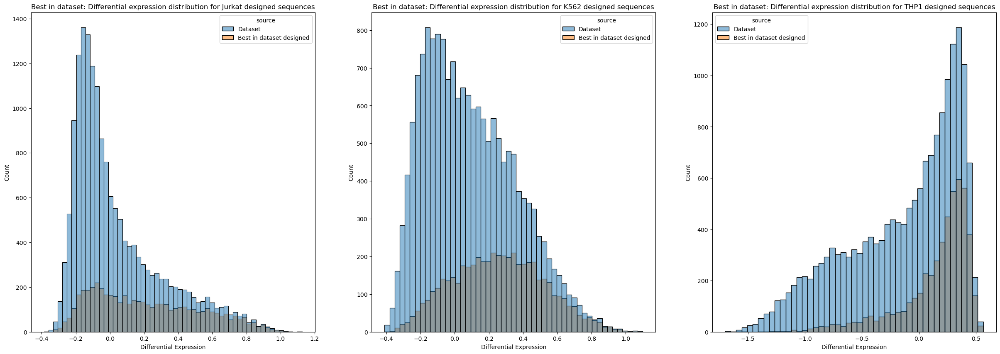

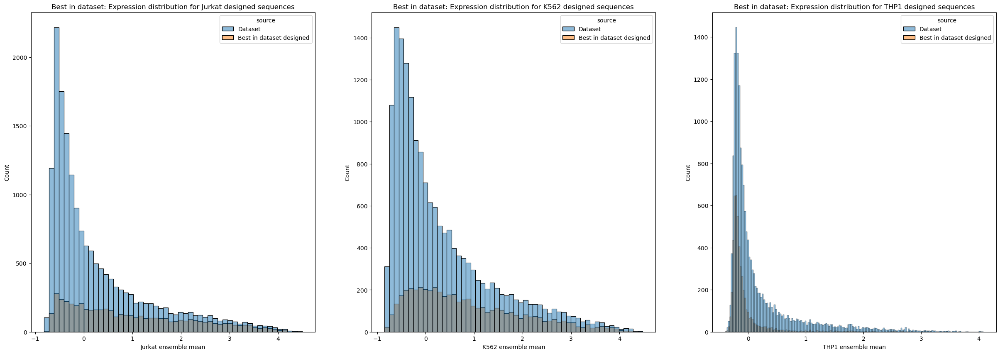

motif_tiling
jurkat
k562
thp1


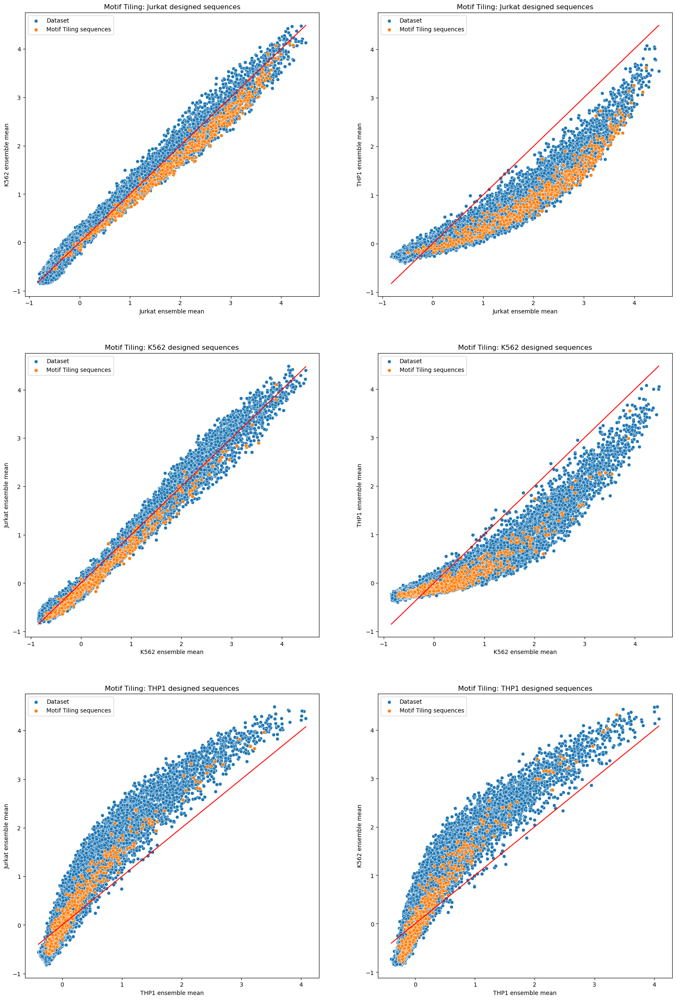

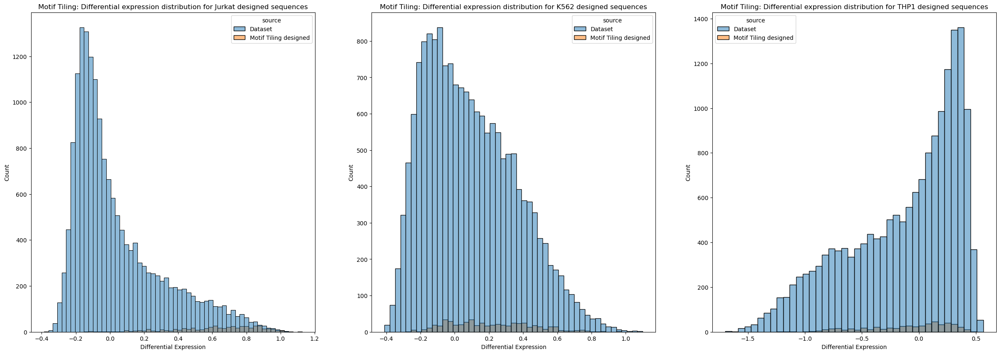

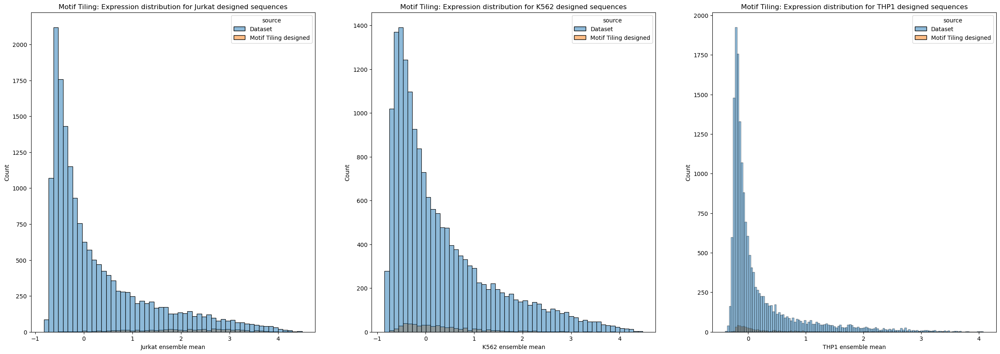

coms_final_design_v2
jurkat
k562
thp1


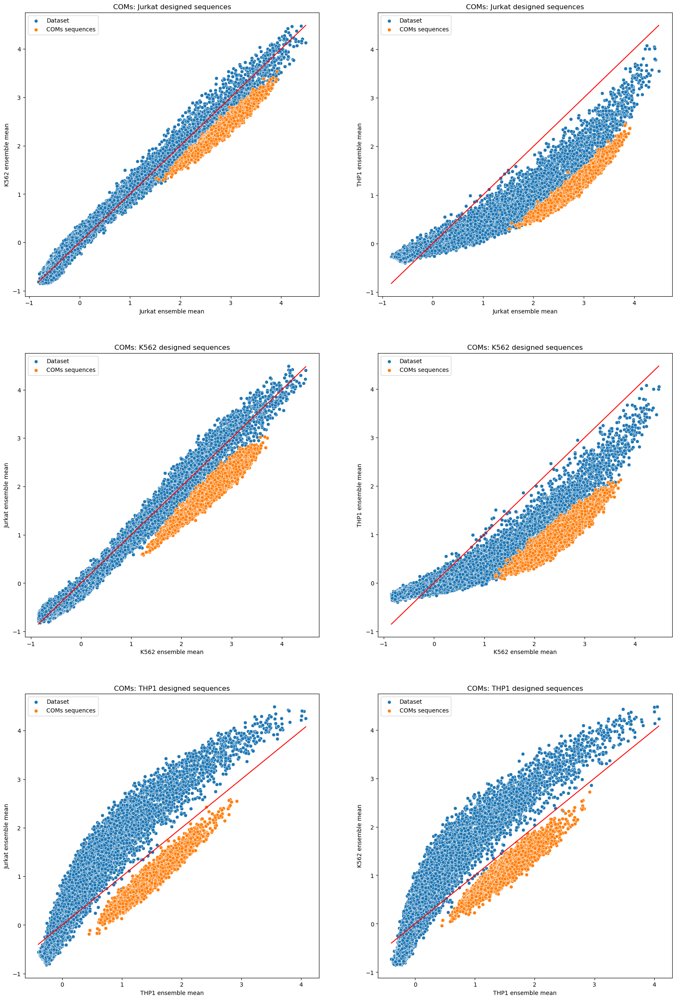

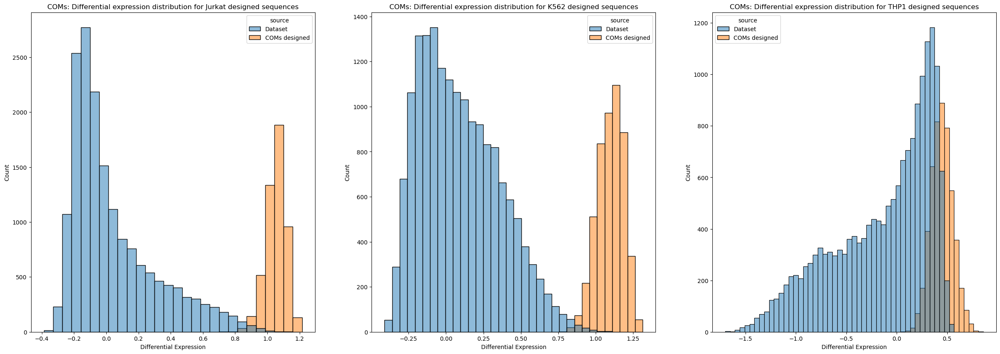

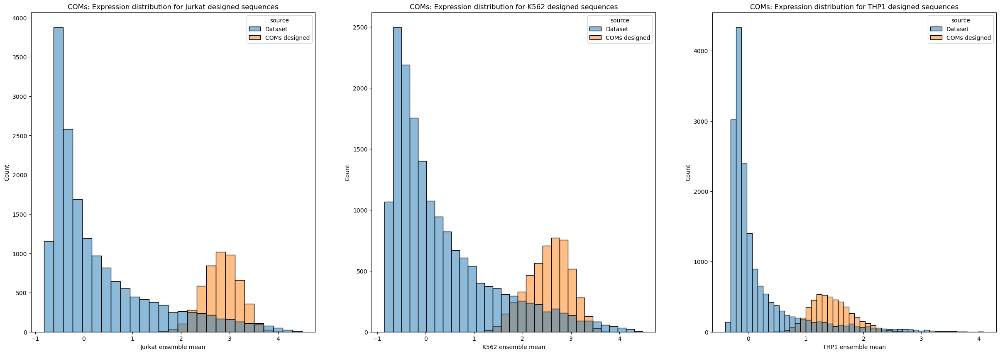

dens_final_design_v2_diversity_0.0
jurkat
k562
thp1


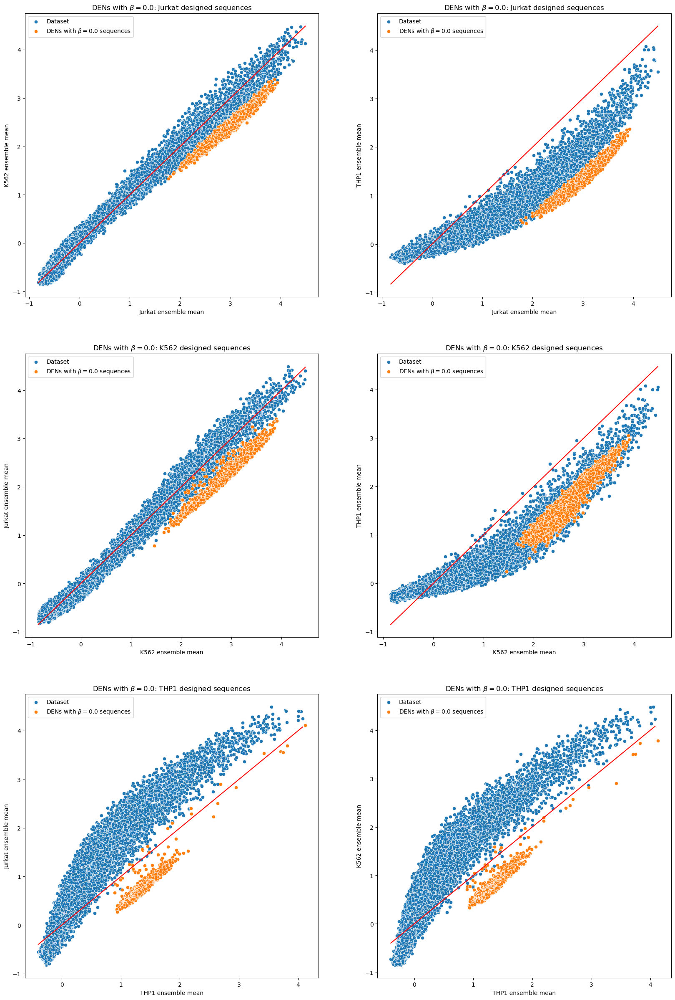

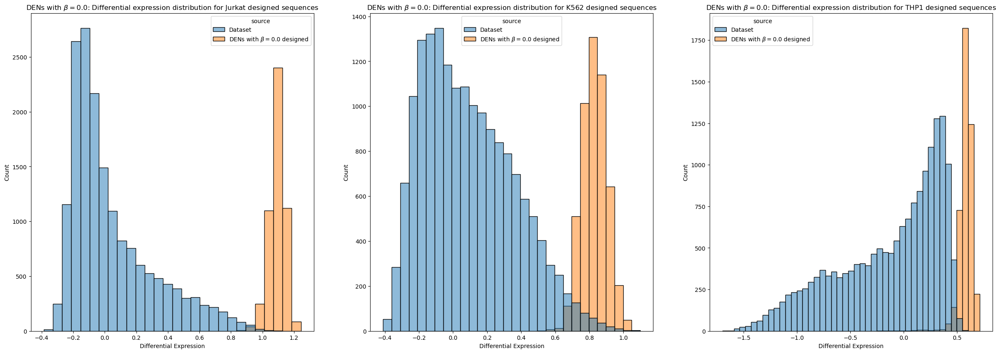

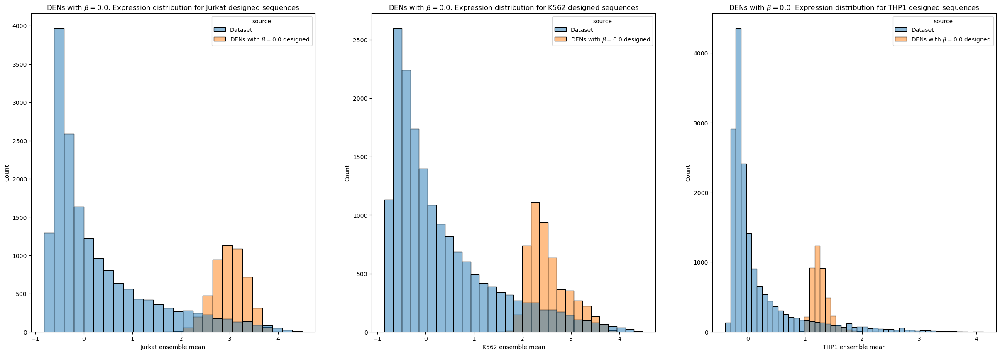

dens_final_design_v2_diversity_0.1
jurkat
k562
thp1


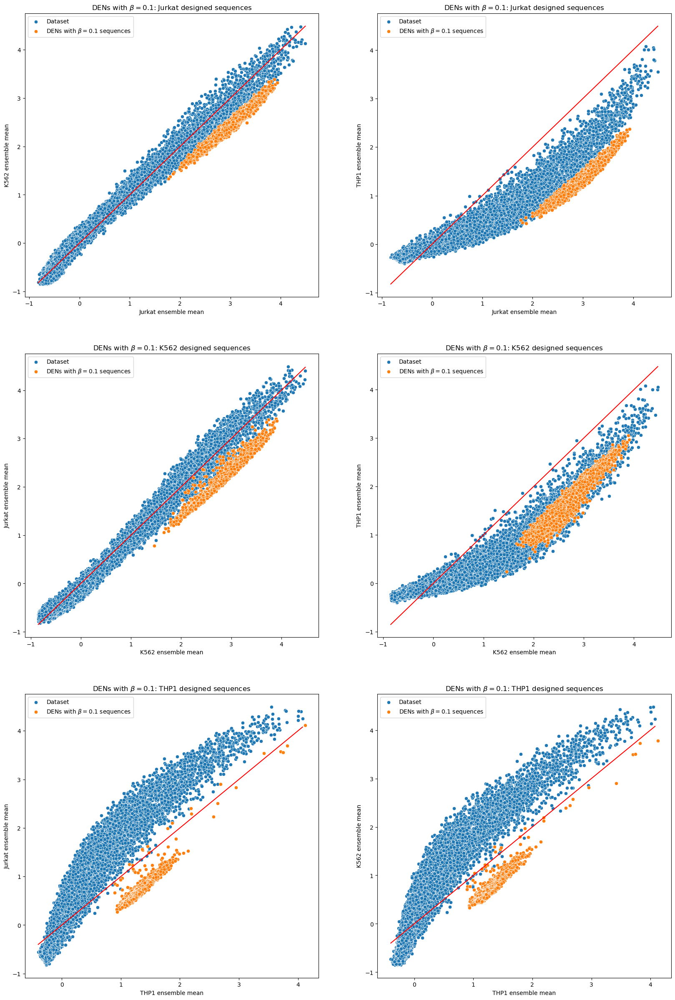

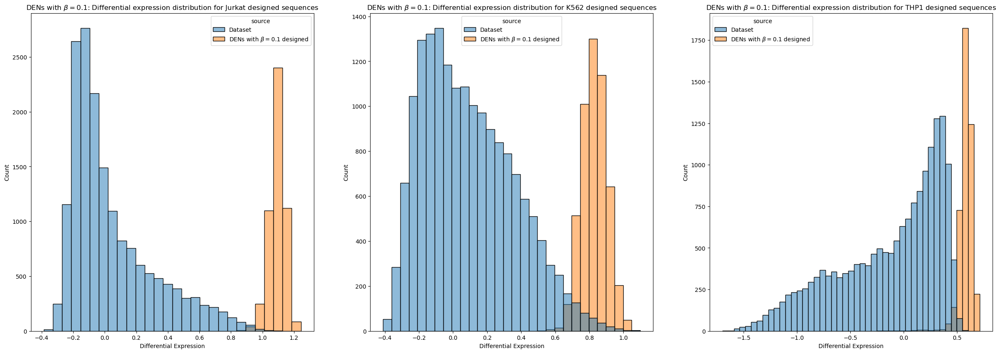

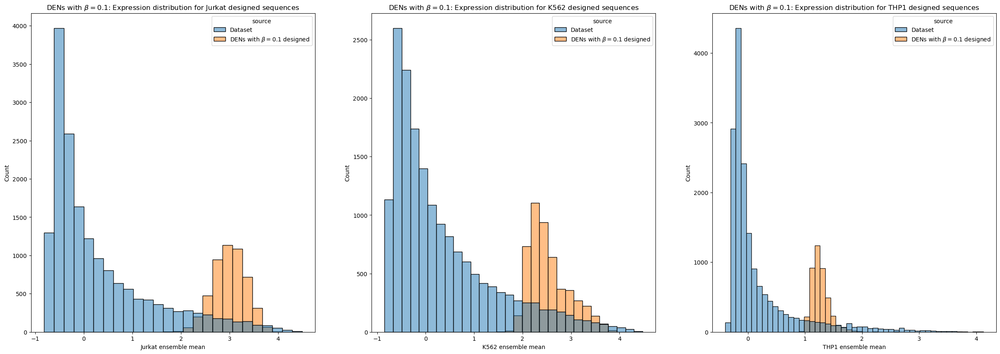

dens_final_design_v2_diversity_0.3
jurkat
k562
thp1


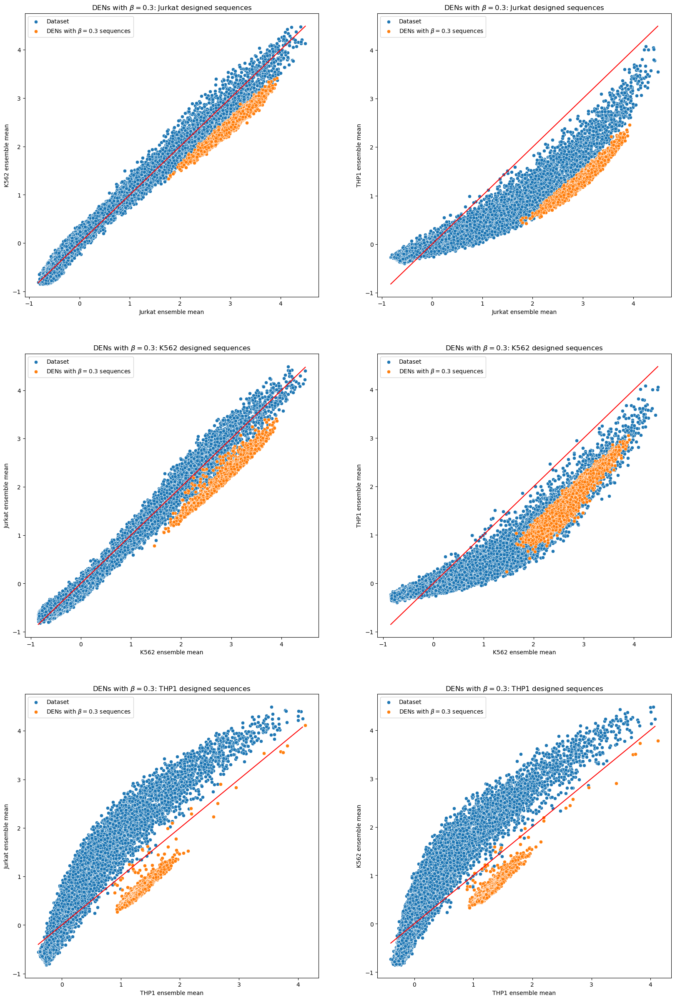

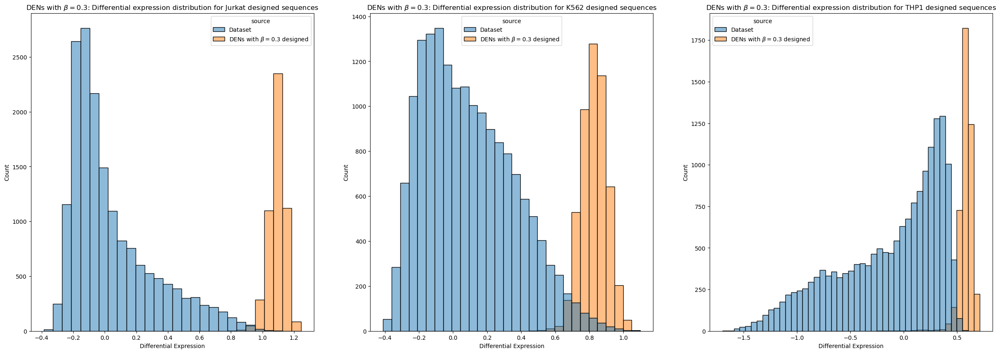

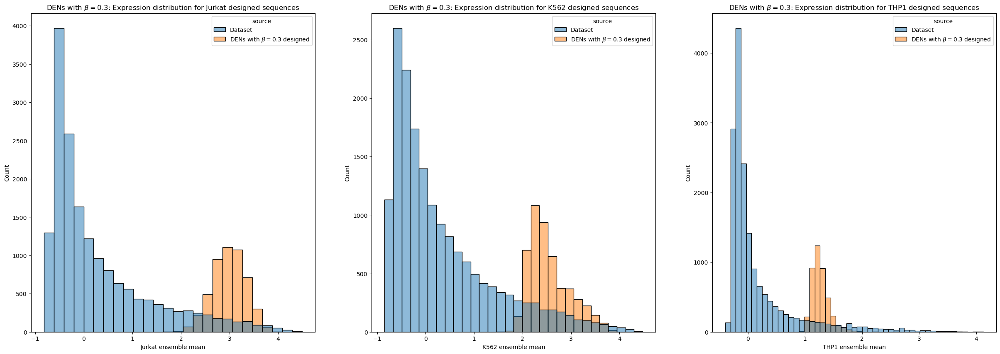

dens_final_design_v2_diversity_1.0
jurkat
k562
thp1


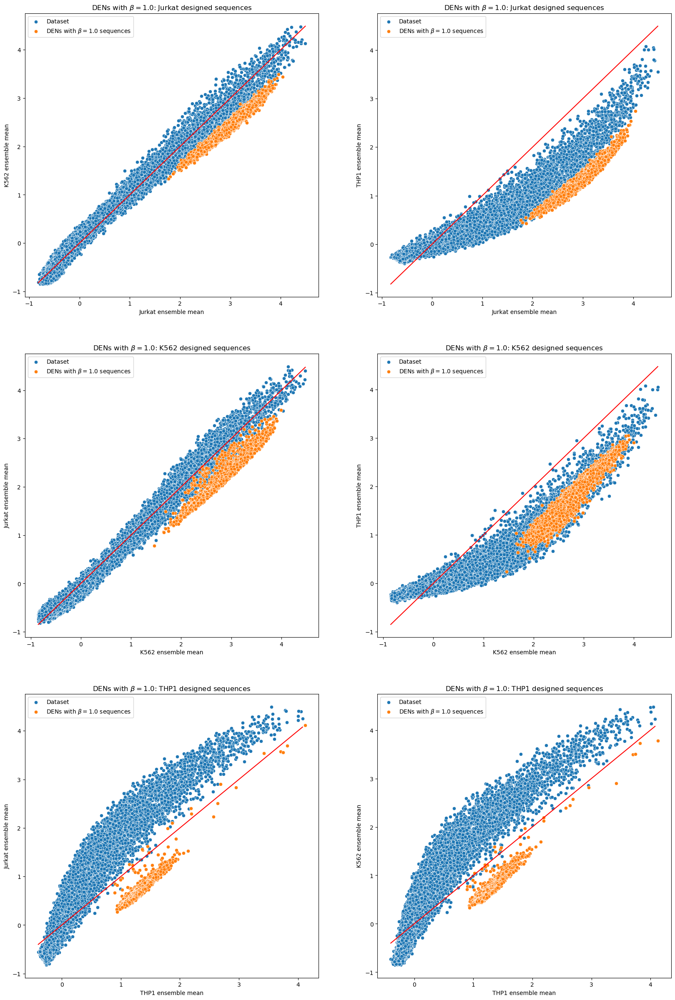

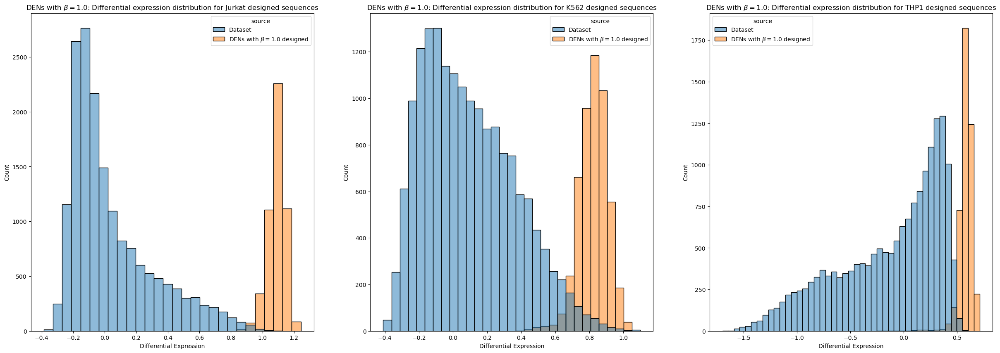

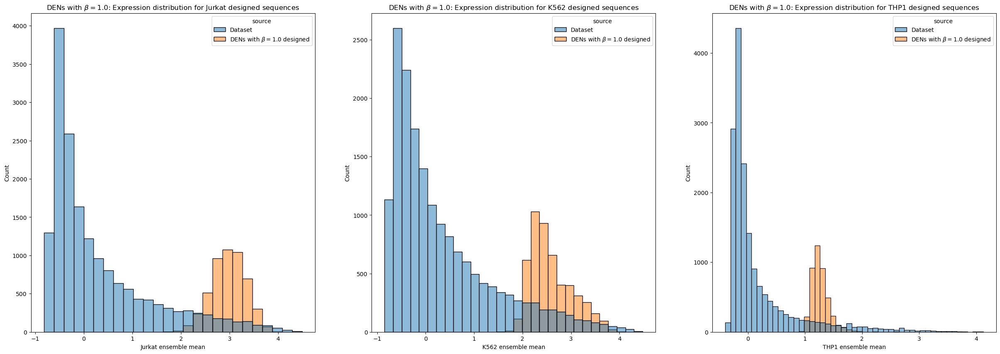

dens_final_design_v2_diversity_3.0
jurkat
k562
thp1


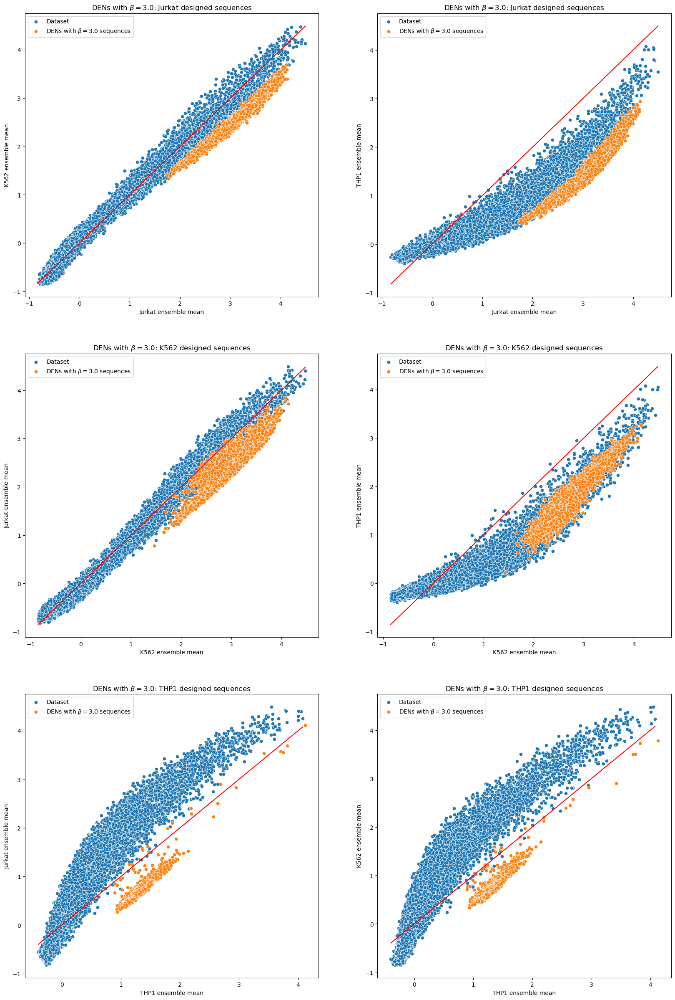

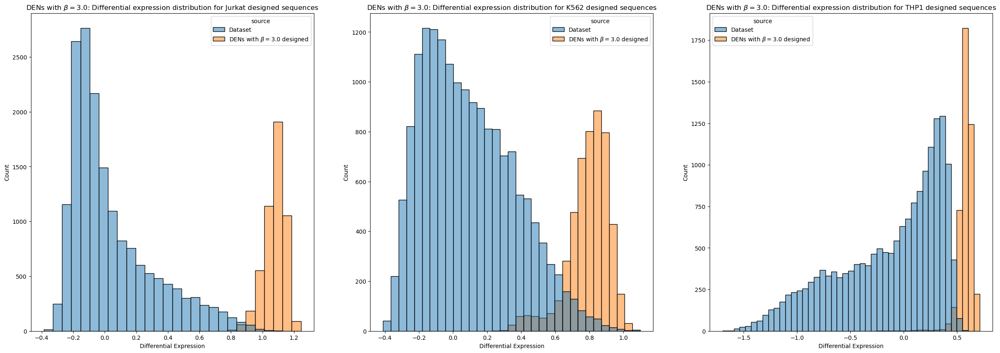

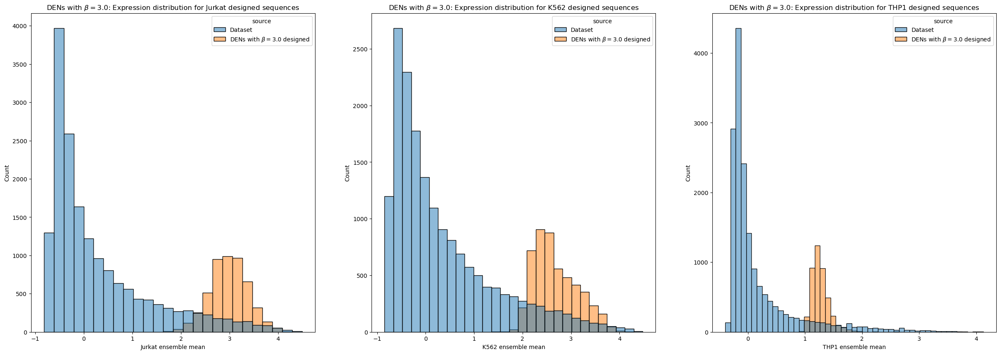

dens_final_design_v2_diversity_10.0
jurkat
k562
thp1


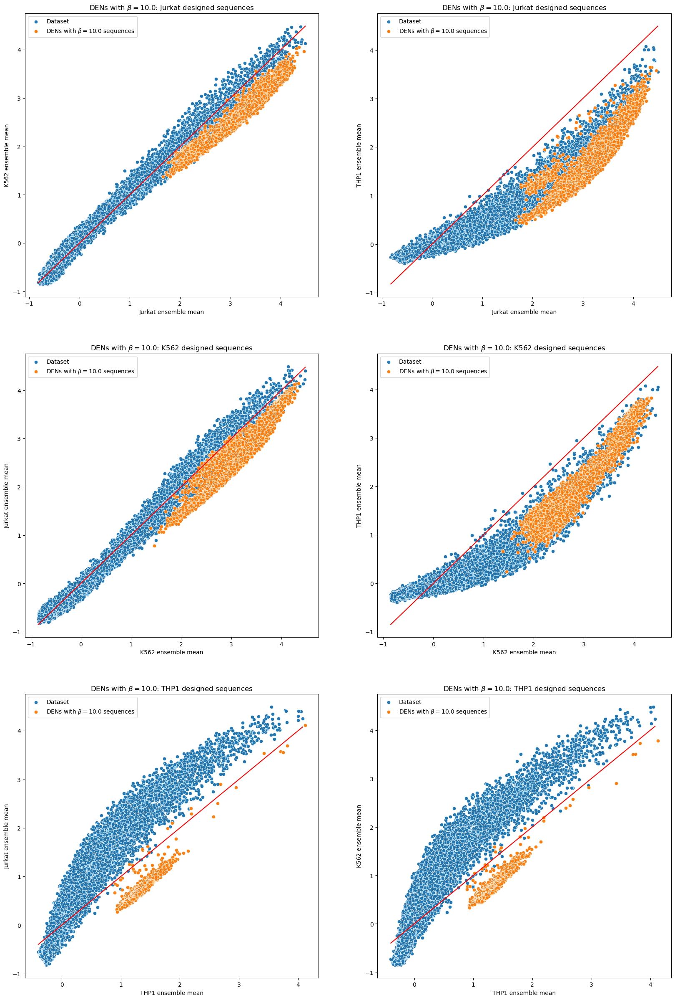

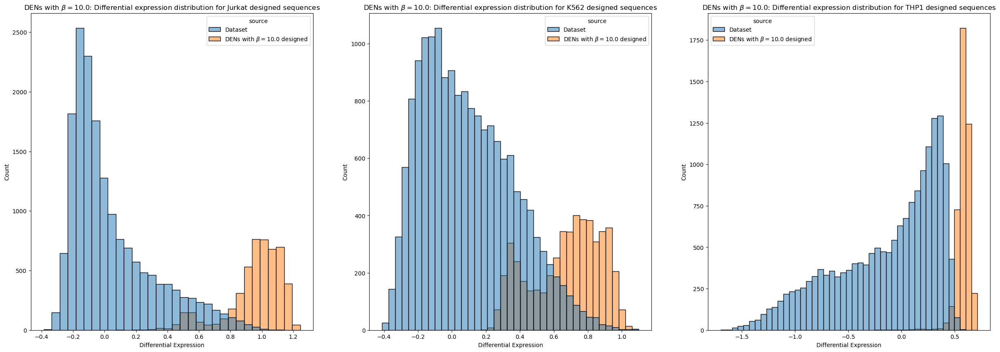

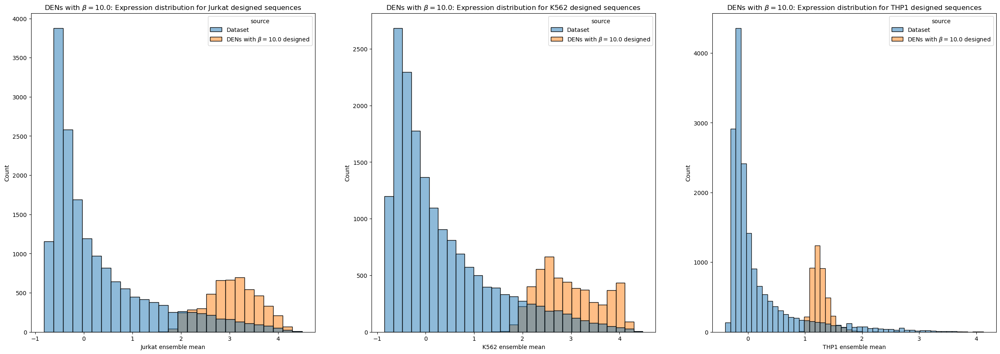

gradient_ascent_final_design_v2
jurkat
k562
thp1


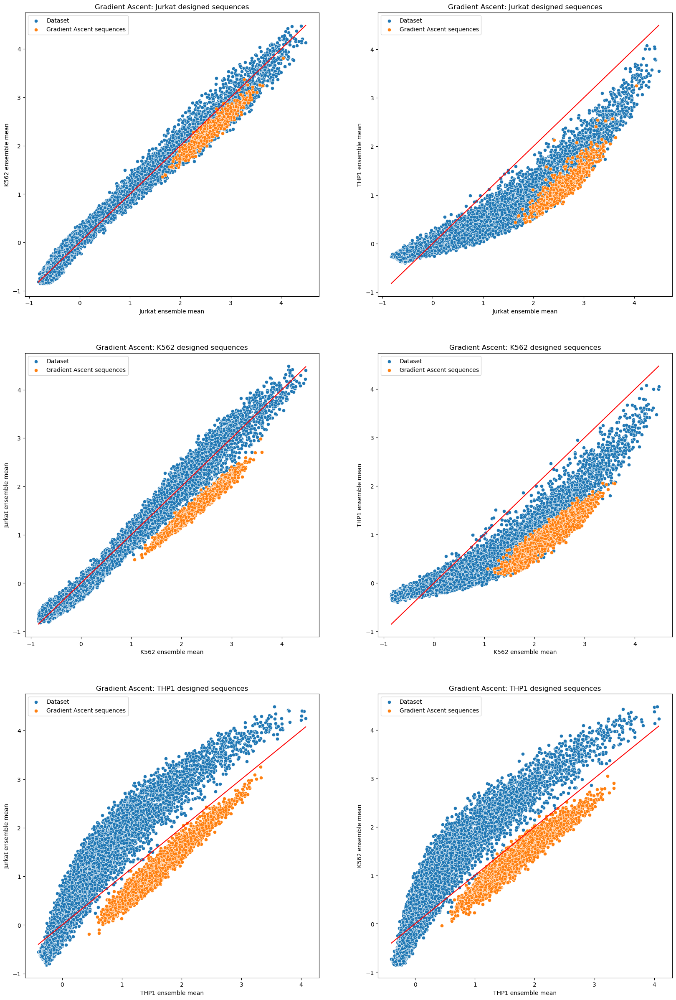

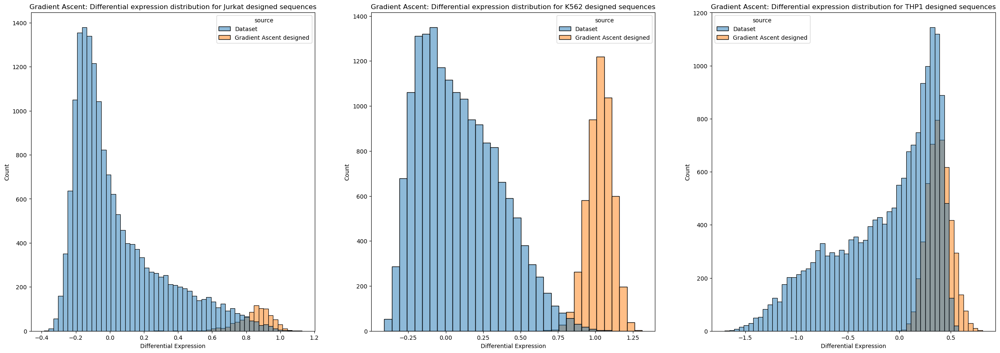

In [ ]:
methods = ["best_in_dataset",
           "motif_tiling", 
           "coms_final_design_v2", 
           "dens_final_design_v2_diversity_0.0", 
           "dens_final_design_v2_diversity_0.1",
           "dens_final_design_v2_diversity_0.3",
           "dens_final_design_v2_diversity_1.0",
           "dens_final_design_v2_diversity_3.0",
           "dens_final_design_v2_diversity_10.0", 
           "gradient_ascent_final_design_v2"]

method_to_name = {"best_in_dataset": "Best in dataset",
                  "motif_tiling": "Motif Tiling", 
                  "coms_final_design_v2": "COMs", 
                  "dens_final_design_v2_diversity_0.0": r"DENs with $\beta = 0.0$", 
                  "dens_final_design_v2_diversity_0.1": r"DENs with $\beta = 0.1$",
                  "dens_final_design_v2_diversity_0.3": r"DENs with $\beta = 0.3$",
                  "dens_final_design_v2_diversity_1.0": r"DENs with $\beta = 1.0$",
                  "dens_final_design_v2_diversity_3.0": r"DENs with $\beta = 3.0$",
                  "dens_final_design_v2_diversity_10.0": r"DENs with $\beta = 10.0$", 
                  "gradient_ascent_final_design_v2": "Gradient Ascent"}

stats_df = {}
stats_df["Method"] = []
stats_df["Cell"] = []
stats_df["Min Exp"] = []
stats_df["Max Exp"] = []
stats_df["Avg Exp"] = []
stats_df["Median Exp"] = []
stats_df["Min DE"] = []
stats_df["Max DE"] = []
stats_df["Avg DE"] = []
stats_df["Median DE"] = []

# v1 sequences
name_map = {"jurkat": "Jurkat", "k562": "K562", "thp1": "THP1"}
for i, method in enumerate(methods):
    print(method)
    if method == "best_in_dataset":
        seqs_ensemble_0 = pickle.load(open(os.path.join(ensemble_predictions_dir, "dataset_seqs_eval_3.pkl"), "rb"))
        seqs_ensemble_1 = pickle.load(open(os.path.join(ensemble_predictions_dir, "dataset_seqs_eval_4.pkl"), "rb"))
        
        df = {}
        df["sequences"] = []
        df["designed_for"] = []    
        
        for cell in ["jurkat", "k562", "thp1"]:
            df[f"{cell}_mean_0"] = []
            df[f"{cell}_mean_1"] = []
        
        for target in ["jurkat", "k562", "thp1"]:            
            data_diff = get_data_diff_exp(seqs_ensemble_0, target)
            filter = (data_diff > np.sort(data_diff)[-5001])
            print(filter.sum())
            diff = get_diff_exp(seqs_ensemble_0, target).mean(axis=0)[filter]
            
            df["sequences"].extend([id2seq(i) for i in seqs_ensemble_0["sequences"][filter]])
            df["designed_for"].extend([target for i in range(5000)])
            for cell in ["jurkat", "k562", "thp1"]:
                df[f"{cell}_mean_0"].extend(seqs_ensemble_0[f'ensemble_sequences_{cell}_pred'].mean(axis=0)[filter])
                df[f"{cell}_mean_1"].extend(seqs_ensemble_1[f'ensemble_sequences_{cell}_pred'].mean(axis=0)[filter])
        
        df = pd.DataFrame(df)
        seqs_df = df.copy()
        
    elif method == "motif_tiling":
        seqs_ensemble_0 = pickle.load(open(os.path.join(ensemble_predictions_dir, "sequences_generated_using_DE_motifs_eval_3.pkl"), "rb"))
        seqs_ensemble_1 = pickle.load(open(os.path.join(ensemble_predictions_dir, "sequences_generated_using_DE_motifs_eval_4.pkl"), "rb"))
        
        df = pd.DataFrame()
        df["sequences"] = [id2seq(i) for i in seqs_ensemble_0["sequence"]]
        df["designed_for"] = [x.lower() for x in seqs_ensemble_0["designed_for"]]
        
        for cell in ["jurkat", "k562", "thp1"]:
            df[f"{cell}_mean_0"] = seqs_ensemble_0[f'ensemble_sequence_{cell}_pred'].mean(axis=0)
            df[f"{cell}_mean_1"] = seqs_ensemble_1[f'ensemble_sequence_{cell}_pred'].mean(axis=0)
        
        seqs_df = df.copy()
        
    else:
        seqs = pickle.load(open(os.path.join(final_design_seqs_dir, f"{method}.pkl"), "rb"))
        seqs_df = []
        kmer_features = {}
        for cell in ["jurkat", "k562", "thp1"]:
            kmer_features[cell] = seqs[cell]["kmer_features"]
            seqs[cell].pop("kmer_features")
            df = pd.DataFrame(seqs[cell])
            df["designed_for"] = cell

            seqs_df.append(df)

        seqs_df = pd.concat(seqs_df).reset_index(drop=True)
    
    ensemble_1_dataset_seqs = ensemble_1_filtered_sequences[ensemble_1_filtered_sequences["design_method"] == "Dataset"].reset_index(drop=True)
    fix, ax = plt.subplots(3, 2, figsize=(20, 30))
    fix2, ax2 = plt.subplots(1, 3, figsize=(30, 10))
    fix3, ax3 = plt.subplots(1, 3, figsize=(30, 10))
    for j, cell in enumerate(["jurkat", "k562", "thp1"]):
        subset_df = seqs_df[seqs_df["designed_for"] == cell].reset_index(drop=True)
        
        # pairwise expression scatter plots
        c = 0
        for k, cell2 in enumerate(["jurkat", "k562", "thp1"]):
            if j == k:
                continue
            sns.scatterplot(data=ensemble_1_dataset_seqs, 
                            x=f"{name_map[cell]}_ensemble_mean", 
                            y=f"{name_map[cell2]}_ensemble_mean", 
                            ax=ax[j][c], label="Dataset")
            sns.scatterplot(data=subset_df, 
                            x=cell+"_mean_1", 
                            y=cell2+"_mean_1", 
                            ax=ax[j][c], label=f"{method_to_name[method]} sequences")
            ax[j][c].set_xlabel(f"{name_map[cell]} ensemble mean")
            ax[j][c].set_ylabel(f"{name_map[cell2]} ensemble mean")
            ax[j][c].plot(np.linspace(ensemble_1_dataset_seqs[f"{name_map[cell]}_ensemble_mean"].min(), ensemble_1_dataset_seqs[f"{name_map[cell]}_ensemble_mean"].max(), 10), 
                     np.linspace(ensemble_1_dataset_seqs[f"{name_map[cell]}_ensemble_mean"].min(), ensemble_1_dataset_seqs[f"{name_map[cell]}_ensemble_mean"].max(), 10),
                     "r-", label="x=y")
            ax[j][c].set_title(f"{method_to_name[method]}: {name_map[cell]} designed sequences")
            c += 1
        
        # stats + distribution plots
        combined_df = {}
        combined_df["sequence"] = list(ensemble_1_dataset_seqs["sequence"]) + list(subset_df["sequences"])
        combined_df["source"] = ["Dataset" for k in list(ensemble_1_dataset_seqs["sequence"])] + \
                                [f"{method_to_name[method]} designed" for k in list(subset_df["sequences"])]
        
        for k, cell2 in enumerate(["jurkat", "k562", "thp1"]):
            combined_df[f"{name_map[cell2]} ensemble mean"] = np.array(list(ensemble_1_dataset_seqs[f"{name_map[cell2]}_ensemble_mean"]) + list(subset_df[cell2+"_mean_1"]))
        
        combined_df["Differential Expression"] = combined_df[f"{name_map[cell]} ensemble mean"].copy()
        for k, cell2 in enumerate(["jurkat", "k562", "thp1"]):
            if j == k:
                continue
            combined_df["Differential Expression"] -= 0.5 * combined_df[f"{name_map[cell2]} ensemble mean"]
        
        combined_df = pd.DataFrame(combined_df)        
        
        print(cell)
        for s, sdf in combined_df.groupby(by="source"):        
            stats_df["Method"].append(s)
            stats_df["Cell"].append(name_map[cell])
            
            stats_df["Min Exp"].append(sdf[f"{name_map[cell]} ensemble mean"].min().round(3))
            stats_df["Max Exp"].append(sdf[f"{name_map[cell]} ensemble mean"].max().round(3))
            stats_df["Avg Exp"].append(sdf[f"{name_map[cell]} ensemble mean"].mean().round(3))
            stats_df["Median Exp"].append(sdf[f"{name_map[cell]} ensemble mean"].median().round(3))
            
            stats_df["Min DE"].append(sdf["Differential Expression"].min().round(3))
            stats_df["Max DE"].append(sdf["Differential Expression"].max().round(3))
            stats_df["Avg DE"].append(sdf["Differential Expression"].mean().round(3))
            stats_df["Median DE"].append(sdf["Differential Expression"].median().round(3))
            
        # distribution of differential expression vs. dataset
        sns.histplot(data=combined_df, x="Differential Expression", hue="source", ax=ax2[j])
        ax2[j].set_title(f"{method_to_name[method]}: Differential expression distribution for {name_map[cell]} designed sequences")
            
        # distribution of expression vs. dataset
        sns.histplot(data=combined_df, x=f"{name_map[cell]} ensemble mean", hue="source", ax=ax3[j])
        ax3[j].set_title(f"{method_to_name[method]}: Expression distribution for {name_map[cell]} designed sequences")
        
    # show the plot
    plt.show()

In [ ]:
stats_df = pd.DataFrame(stats_df).drop_duplicates().sort_values(by=["Cell", "Method"]).reset_index(drop=True)
stats_df.to_csv("QC0_stats_writeup.tsv", sep="\t", index=None)

In [ ]:
stats_df